In [76]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import os
import glob
import pandas as pd
home_directory = "/d/ret1/Taylor/jupyter_notebooks/Research" 
os.chdir(home_directory) #TJ change working directory to be the parent directory
from Py_files.Basic_analysis import *


from astropy.coordinates import SkyCoord
from astropy.table import Table
import astropy.units as u
from astropy.wcs import WCS
from astropy.constants import c
from astropy.io import fits
from astropy.visualization import simple_norm, imshow_norm
from photutils.aperture import CircularAperture, aperture_photometry

from scipy.ndimage import label, find_objects


#Email kirstin larson about continuum subtraction
raw_files= glob.glob('Data_files/Paschen_EW/*continuum.fits')
cont_subtracted_files = glob.glob('Data_files/Paschen_EW/*line.fits')
ic1954_files = glob.glob('Data_files/Paschen_EW/Pa_update_7-3-25/ic1954_*')
ic5273_files = glob.glob('Data_files/Paschen_EW/Pa_update_7-3-25/ic5273_*')
ngc3368_files = glob.glob('Data_files/Paschen_EW/Pa_update_7-3-25/ngc3368_*')

In [83]:

def pick_random_source_location(file, threshold_percentile=95, min_size=100):
    '''
    Picks a random source location from regions with multiple adjacent pixels above a threshold percentile.
    
    Parameters
    ----------
    file : type = str - path to fits file
    threshold_percentile : type = float - minimum percentile for flux through group of pixels
                        For example 80, would limit selections to groups of pixels that are brighter than 80% of possible groups
    min_size : type = int - minimum number of adjacent pixels to be considered a valid selection
    
    Returns
    -------
    loc : type = list - [ra, dec] in degrees.
    '''
    # Load FITS
    hdul = fits.open(file)
    data = hdul[0].data
    header = hdul[0].header
    wcs = WCS(header)
        
    # Compute threshold
    thresh = np.nanpercentile(data, threshold_percentile)
    
    # Threshold image to create a binary mask
    mask = data > thresh
    
    # Label connected components
    labeled, num_features = label(mask)
    
    # Find slices of labeled regions
    slices = find_objects(labeled)
    
    # Filter valid regions based on size
    valid_labels = []
    for i, slc in enumerate(slices):
        region = (labeled[slc] == (i+1))
        if region.sum() >= min_size:
            valid_labels.append(i+1)
    
    if not valid_labels:
        raise ValueError(f"No regions found with >= {min_size} connected pixels above {threshold_percentile}th percentile.")
    print(len(valid_labels), "regions found")
    # Choose a random valid region
    chosen_label = np.random.choice(valid_labels)
    
    # Get indices of pixels in this region
    region_indices = np.argwhere(labeled == chosen_label)
    ys, xs = region_indices[:,0], region_indices[:,1]
    fluxes = data[ys, xs]
    
    # Calculate flux-weighted centroid in pixel coordinates
    total_flux = np.nansum(fluxes)
    x_centroid = np.nansum(xs * fluxes) / total_flux
    y_centroid = np.nansum(ys * fluxes) / total_flux
    
    # Convert to sky coordinates
    sky = wcs.pixel_to_world(x_centroid, y_centroid)

    return sky.ra.deg, sky.dec.deg


def get_aperture_flux(file, loc, radius, show_plot= False, zoom = None):
    '''display image of fits file, with aperture with radius at location, can also specify zoom
    -------------
    Parameters
    -------------
    file : type = str - string to fits file you want to display, can be a list of locations (len(loc) must equal len(radius))
    loc : type = either [ra, dec] in degrees, or a SkyCoord object - location of center of the aperture
    radius : type = angular unit - radius of aperture with units attached
    show_plot (optional, defaults to false) : type = Boolean - show png of image?
    zoom : type = angular unit, or list of units - width and height of the fov in the image if single value, if list [width, height]

    Returns
    -------------
    flux : type = float - in units of the image file, total flux through aperture.
    '''   

    hdul = fits.open(file)
    data = hdul[0].data
    header = hdul[0].header
    pix_area = header["PIXAR_SR"]
    # Create WCS object
    wcs = WCS(header)

    # Plot with imshow_norm
    if show_plot:
        try:
            plt.figure(figsize = (8,8*zoom[1]/zoom[0]))
        except:
            plt.figure(figsize=(8,8))
        ax = plt.subplot(projection=wcs)
        norm = simple_norm(data, stretch='asinh', percent=96.9)
        im = ax.imshow(data, norm=norm, cmap='gray', origin='lower')
        
        # Add RA/Dec gridlines and labels
        ax.coords.grid(True, color='white', ls='dotted')
        ax.coords[0].set_axislabel('RA')
        ax.coords[1].set_axislabel('Dec')
    if (type(loc[0]) == float) or (type(loc[0])==np.float64):
        x,y = wcs.all_world2pix(loc[0], loc[1], 0)
        aperture = CircularAperture((x, y), r=radius.to_value(u.deg) / header['CDELT2'])
        phot_result = aperture_photometry(data, aperture)
        flux = phot_result['aperture_sum'][0]
        if show_plot:
            aperture.plot(color='red', lw=2, alpha=0.7, label=f'{flux} MJy')
    else:
        flux = []
        for location in loc:
            x,y = wcs.all_world2pix(location[0], location[1], 0)
            aperture = CircularAperture((x, y), r=radius.to_value(u.deg) / header['CDELT2'])
            phot_result = aperture_photometry(data, aperture)
            this_flux = phot_result['aperture_sum'][0]*pix_area
            flux.append(this_flux)
            if show_plot:
                aperture.plot(color='red', lw=2, alpha=0.7, label=f'{radius}" Aperture')
    if show_plot and (zoom is not None):
        # Calculate half-width in pixels
        pix_scale = abs(header['CDELT2']) * u.deg  # pixel scale in deg/pix
        try:
            npix_half_x = (zoom[0].to(u.deg) / pix_scale).value / 2
            npix_half_y = (zoom[1].to(u.deg) / pix_scale).value / 2
            ax.set_xlim(x - npix_half_x, x + npix_half_x)
            ax.set_ylim(y - npix_half_y, y + npix_half_y)
        except:
            npix_half = (zoom.to(u.deg) / pix_scale).value / 2
            ax.set_xlim(x - npix_half, x + npix_half)
            ax.set_ylim(y - npix_half, y + npix_half)
    if show_plot:
        ax.legend()

        # Colorbar
        plt.colorbar(im, ax=ax, orientation='vertical', label='Flux')
        
        plt.title(f"{file.split('.fi')[0].split('/')[-1].split('/')[-1]}")
        plt.show()
    return flux

1
ic1954_f187n_continuum
2.22188686296538e-14


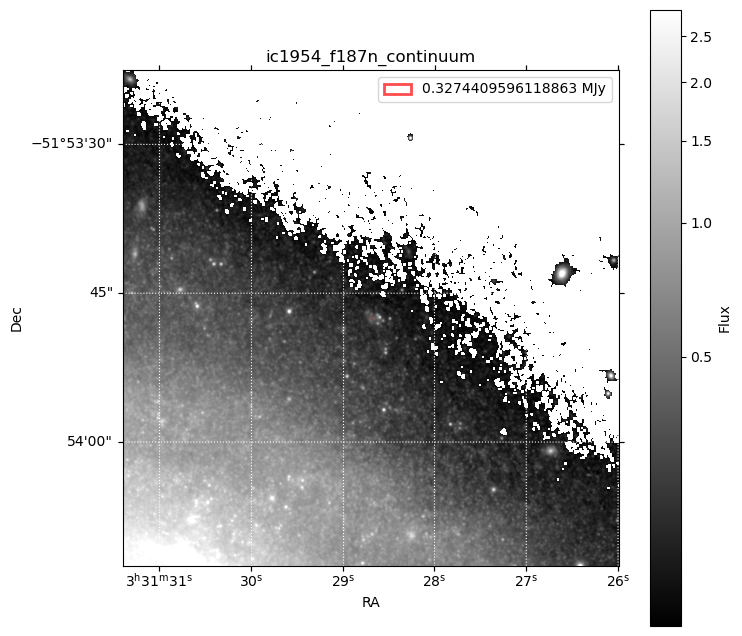

2
ic1954_f187n_continuum_proj
2.22188686296538e-14


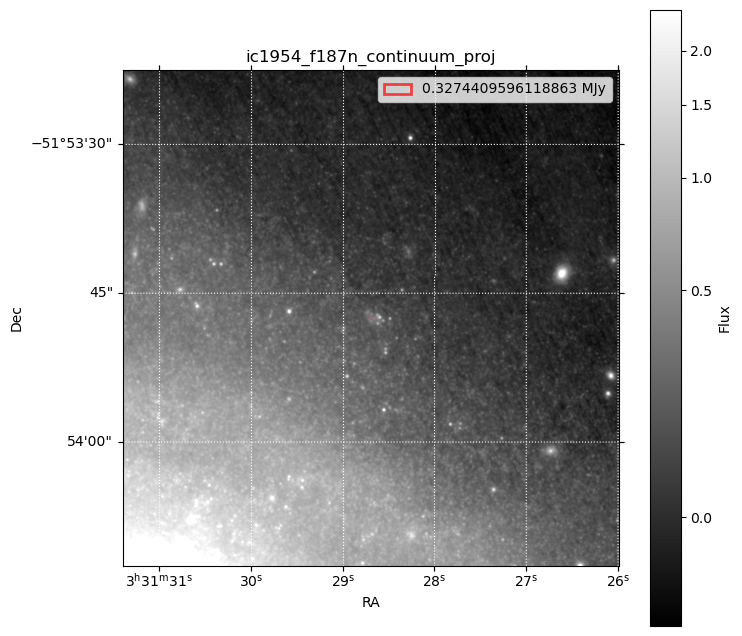

3
ic1954_f187n_line
2.22188686296538e-14


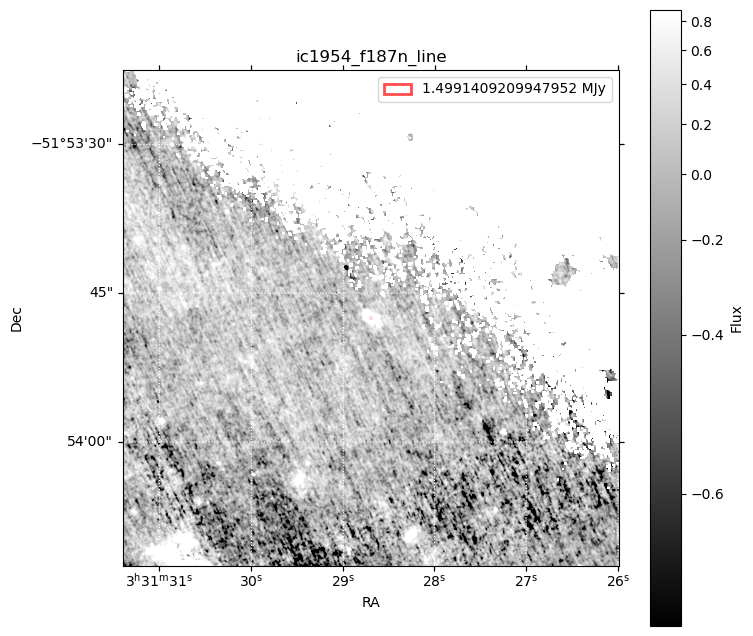

4
ic1954_f187n_line_proj
2.22188686296538e-14


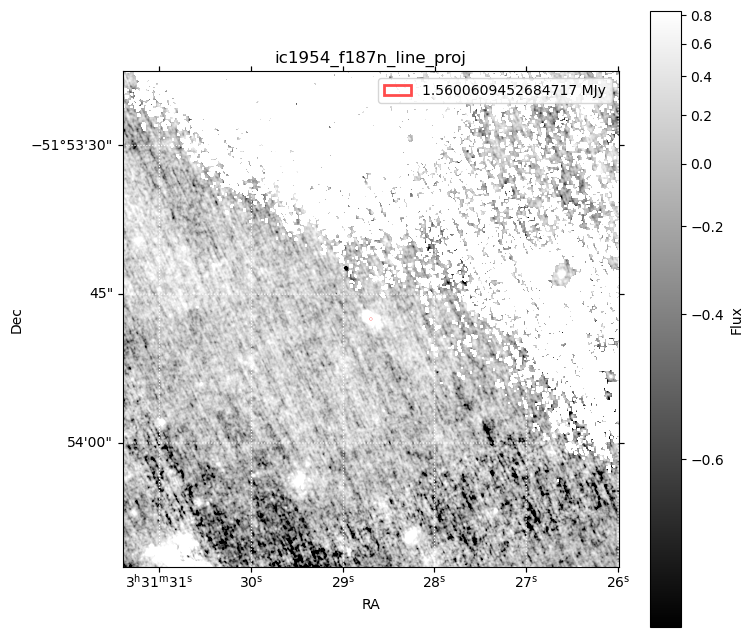

5
ic1954_nircam_lv3_f150w_conv
file ic1954_nircam_lv3_f150w_conv has no pixel area


KeyError: "Keyword 'CDELT1' not found."

In [84]:
i=0
for file in ic1954_files:
    i+=1
    print(i)
    hdu = fits.open(file)[0]
    print(file.split('.fi')[0].split('/')[-1].split('/')[-1])
    try:
        print(hdu.header['PIXAR_SR'])
    except:
        print(f"file {file.split('.fi')[0].split('/')[-1].split('/')[-1]} has no pixel area")
    get_aperture_flux(file, loc, (hdu.header['CDELT1']/2)*u.deg, show_plot= True, zoom = zoom)

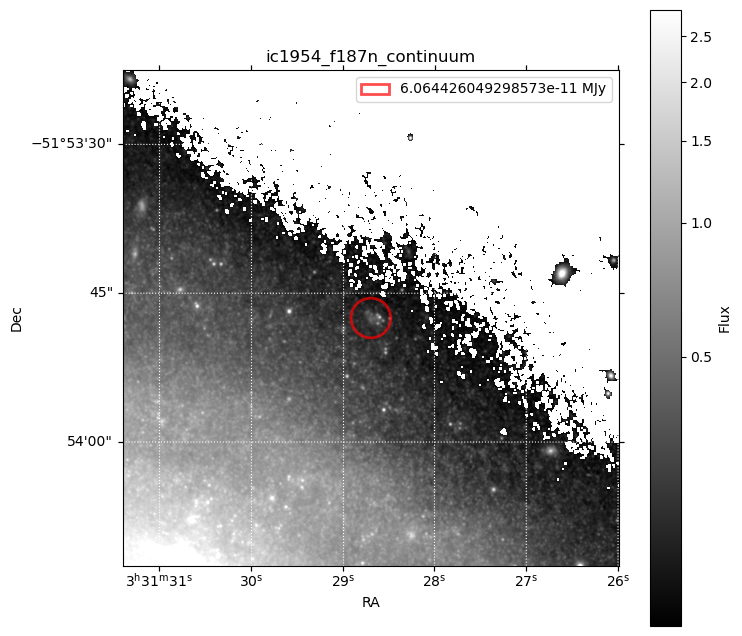

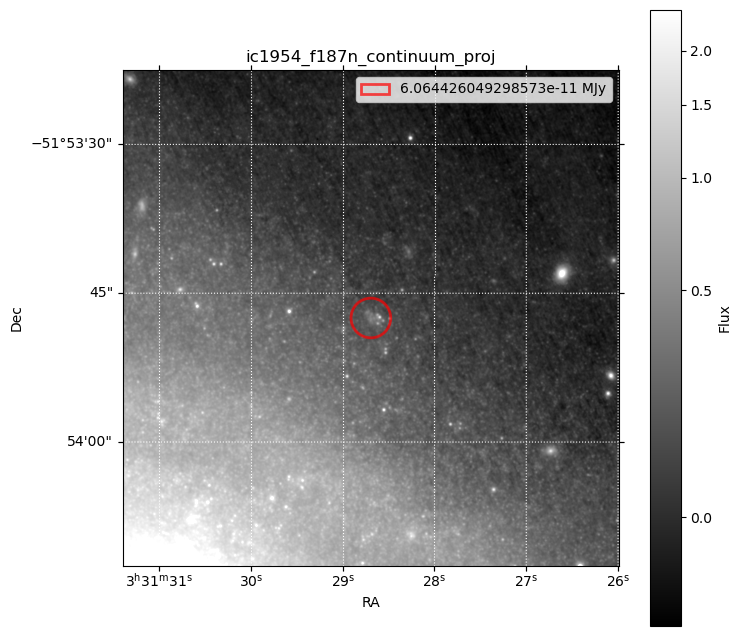

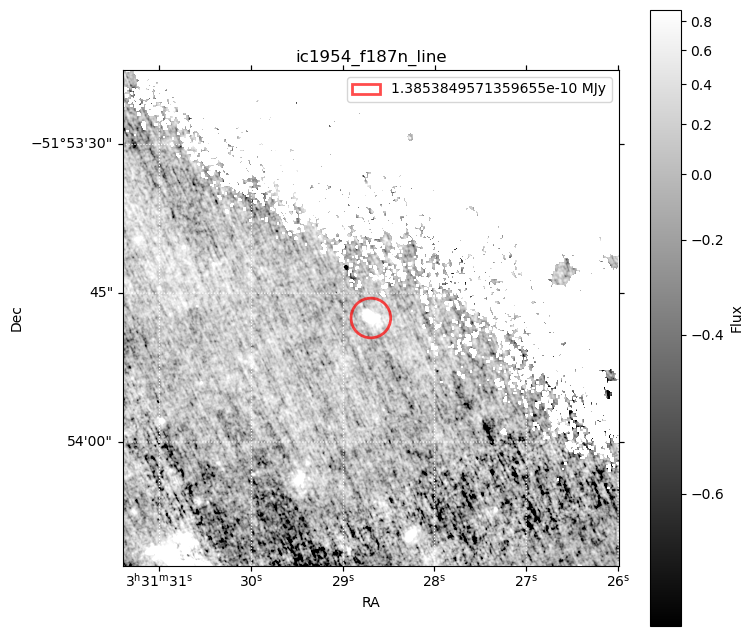

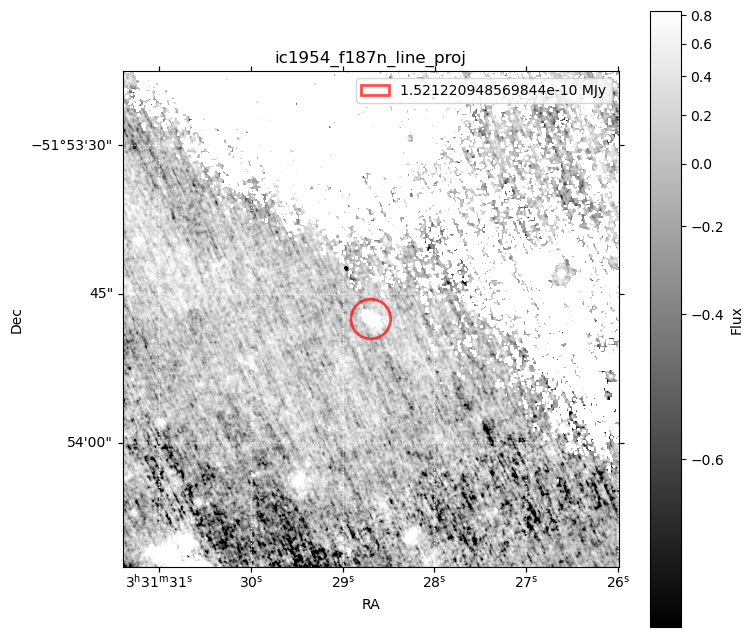

KeyError: "Keyword 'PIXAR_SR' not found."

In [78]:
loc = [((3 + (31/60) + (28.693/3600))/24)*360,-(51 + (53/60) + (47.5/3600))]
radius = 1*u.arcsec
zoom = radius*50
for file in ic1954_files:
    get_aperture_flux(file, loc, radius*2, show_plot= True, zoom = zoom)

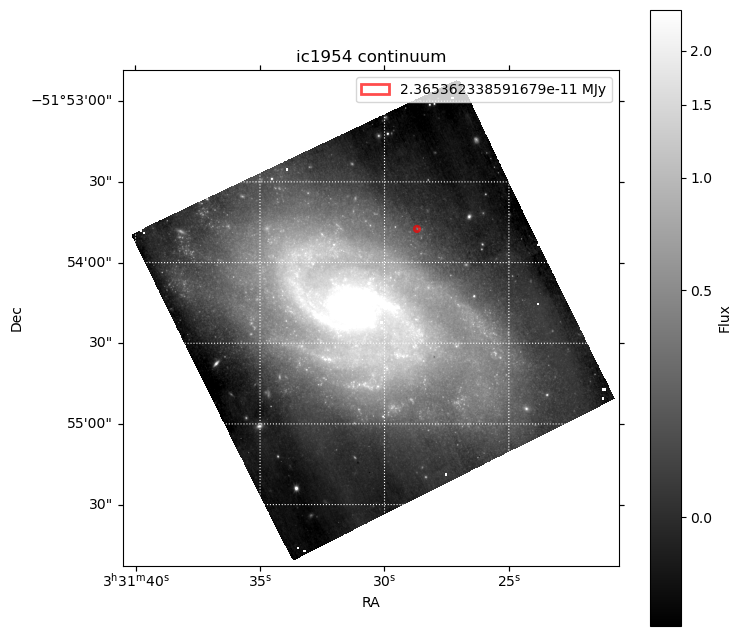

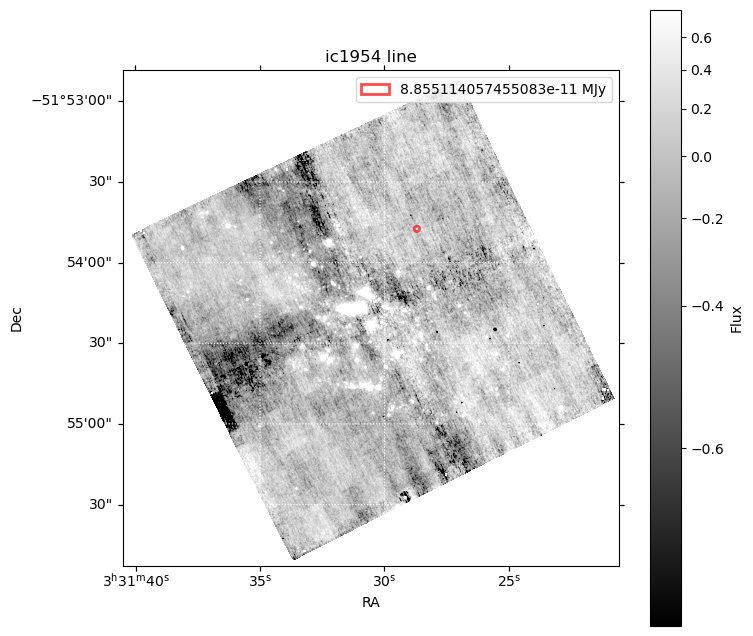

In [36]:
loc = [((3 + (31/60) + (28.693/3600))/24)*360,-(51 + (53/60) + (47.5/3600))]
radius = 1*u.arcsec
raw = get_aperture_flux('Data_files/Paschen_EW/ic1954_f187n_continuum.fits', loc, radius, show_plot=True)
cont = get_aperture_flux('Data_files/Paschen_EW/ic1954_f187n_line.fits', loc, radius, show_plot=True)

6761 regions found


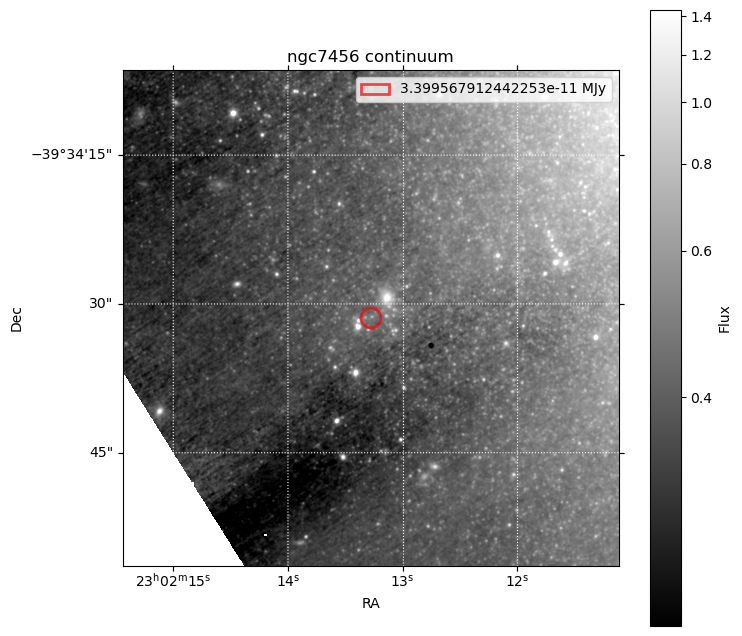

6761 regions found


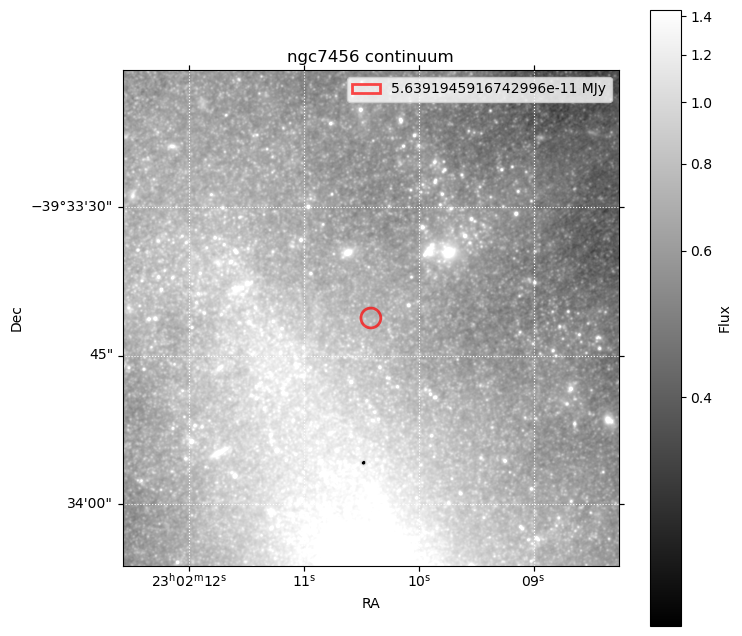

6761 regions found


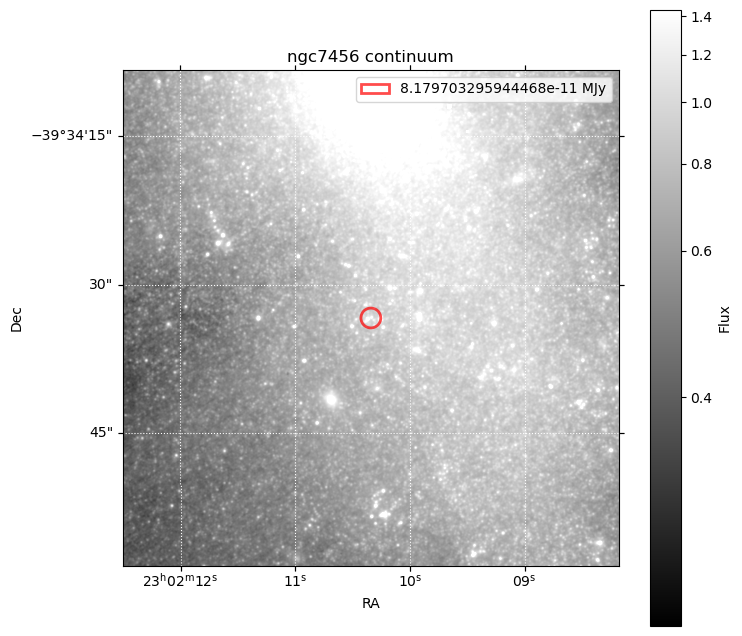

6761 regions found


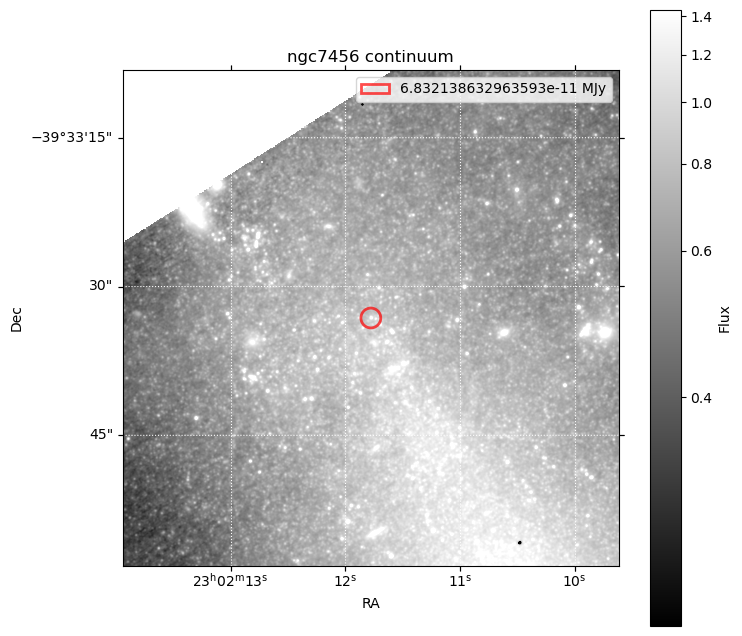

6761 regions found


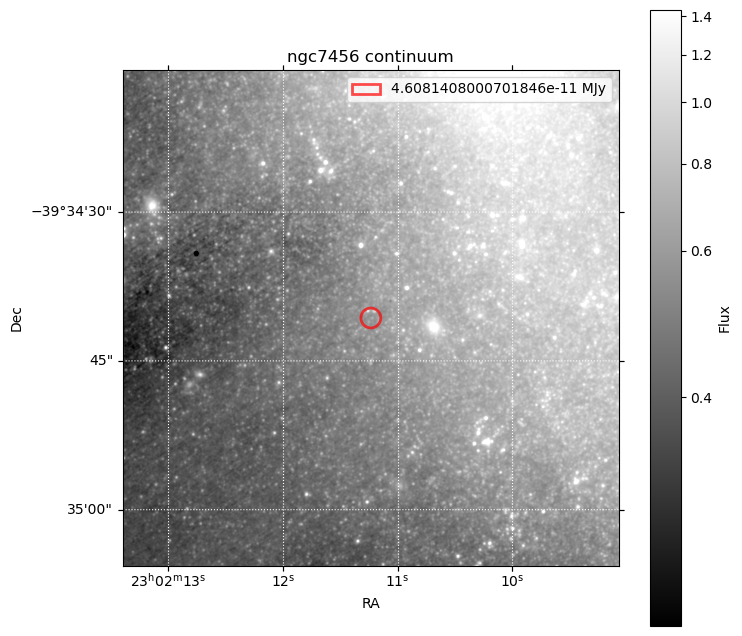

6761 regions found


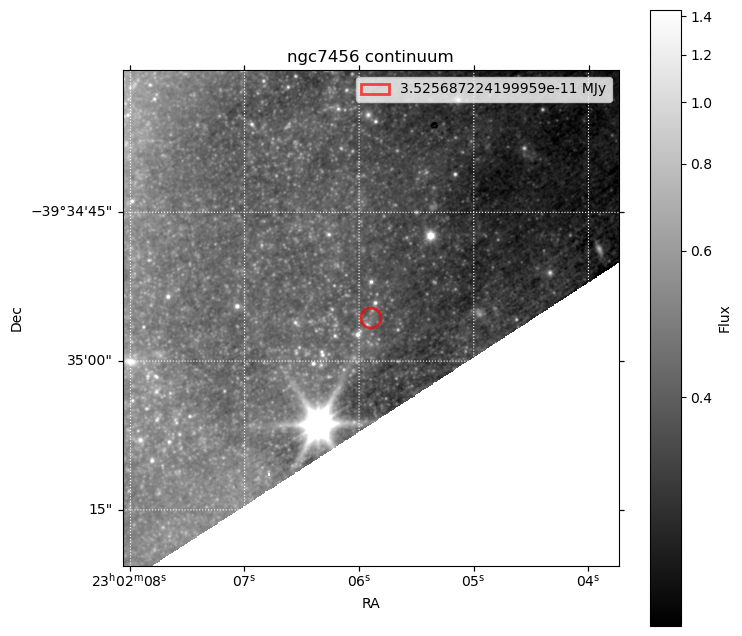

6761 regions found


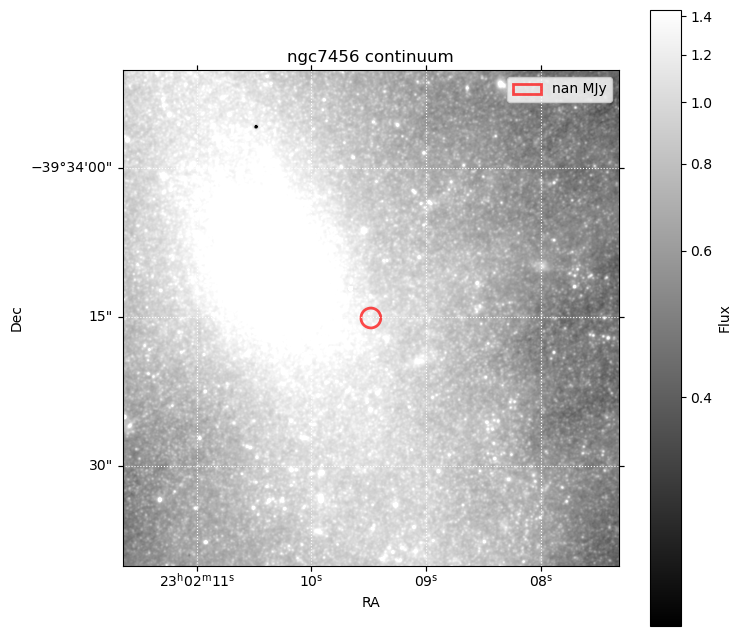

6761 regions found


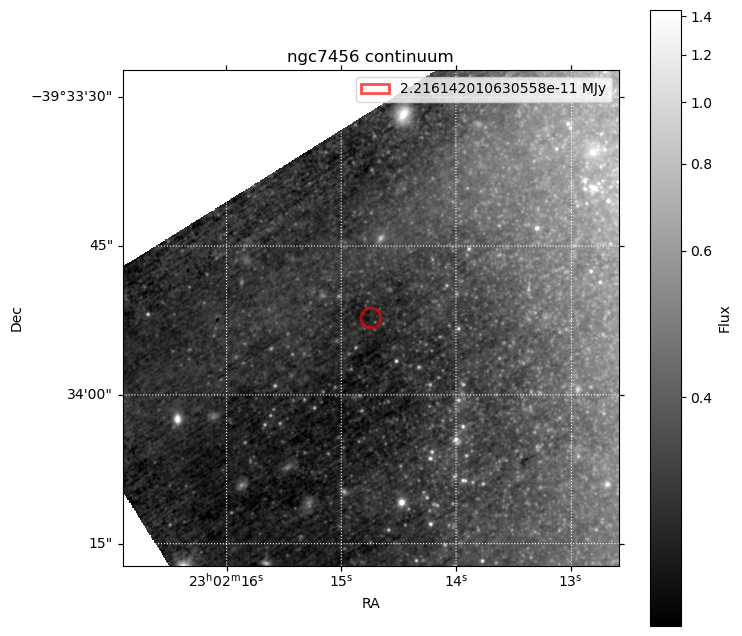

6761 regions found


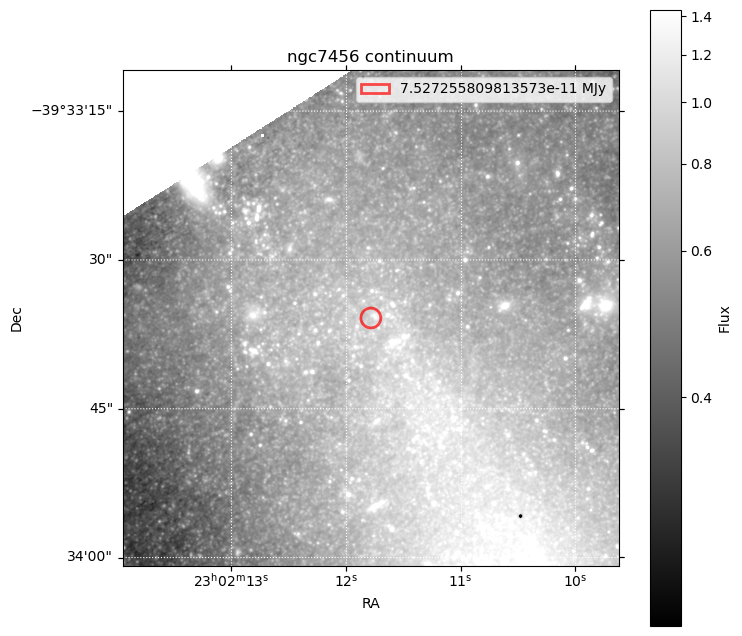

6761 regions found


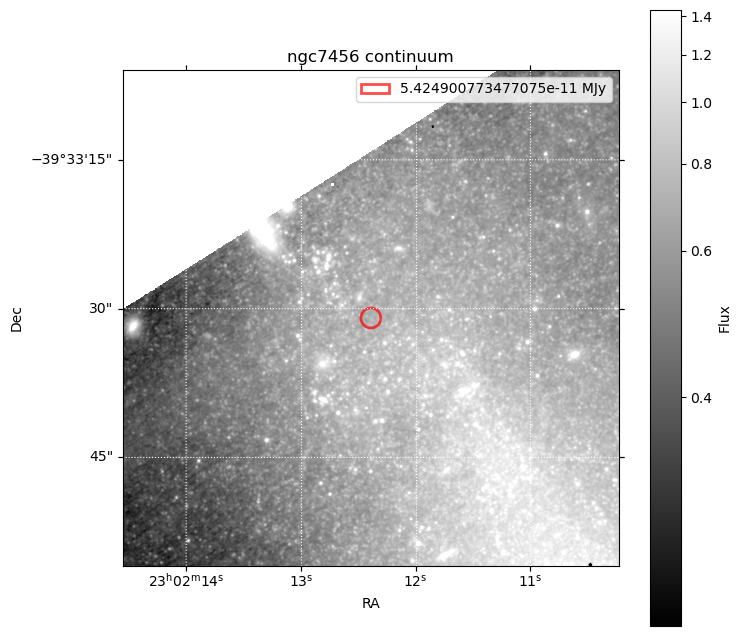

6761 regions found


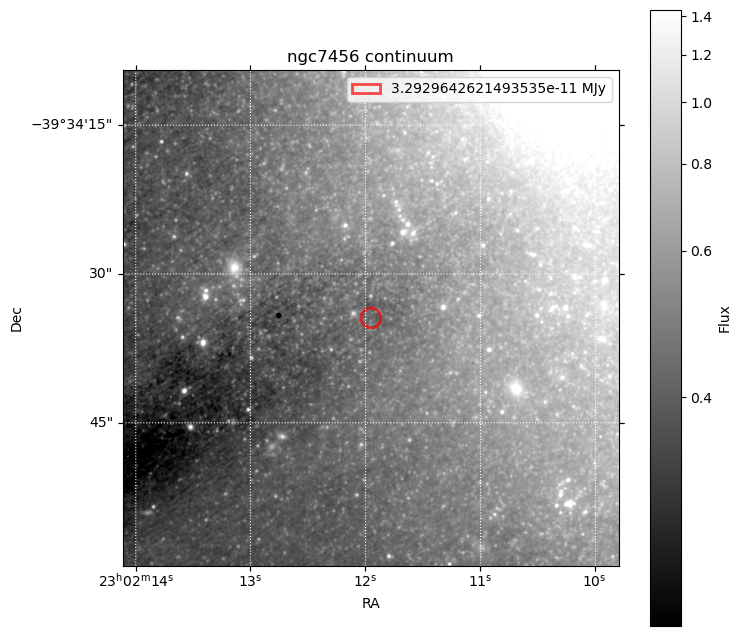

6761 regions found


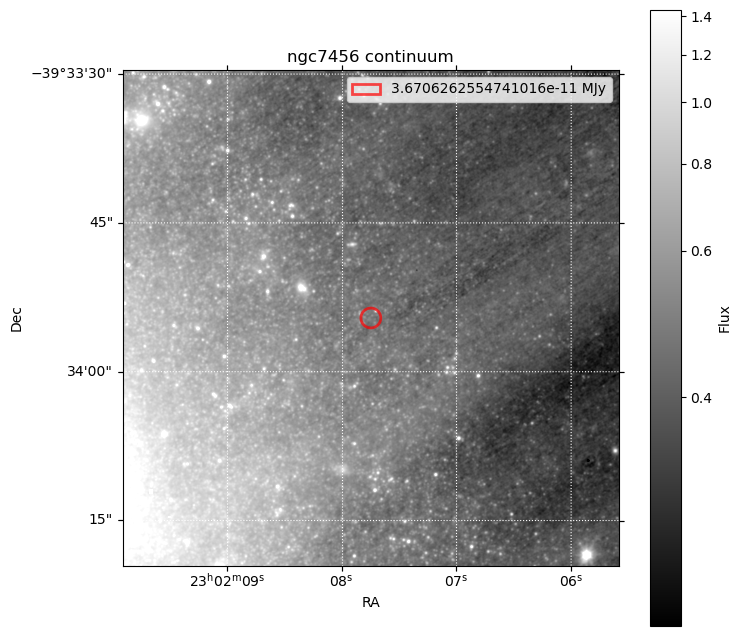

6761 regions found


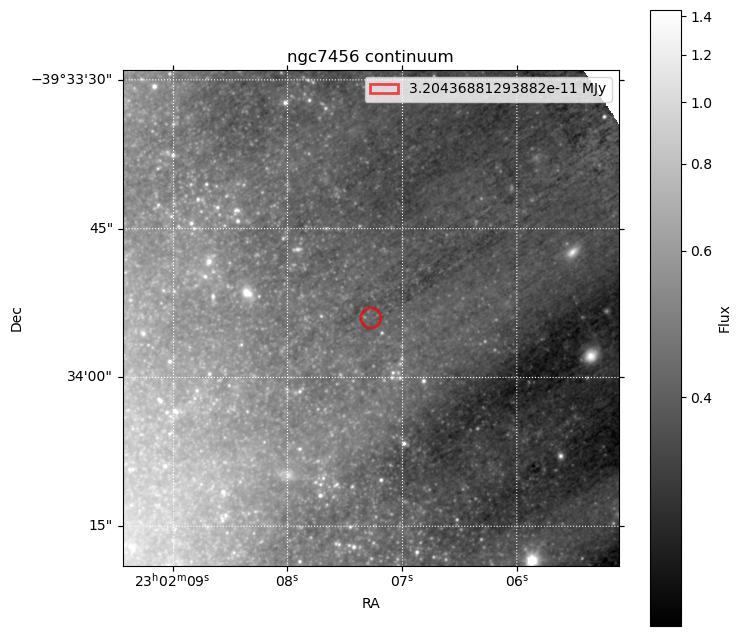

6761 regions found


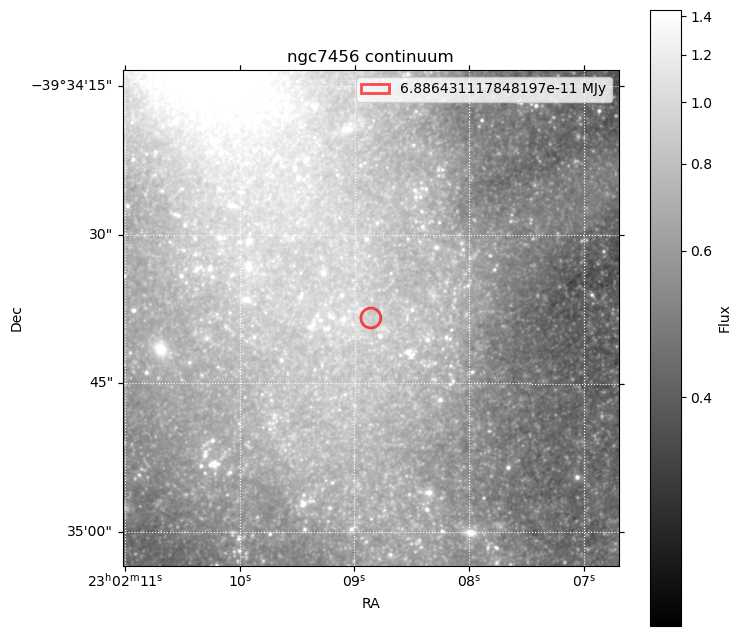

6761 regions found


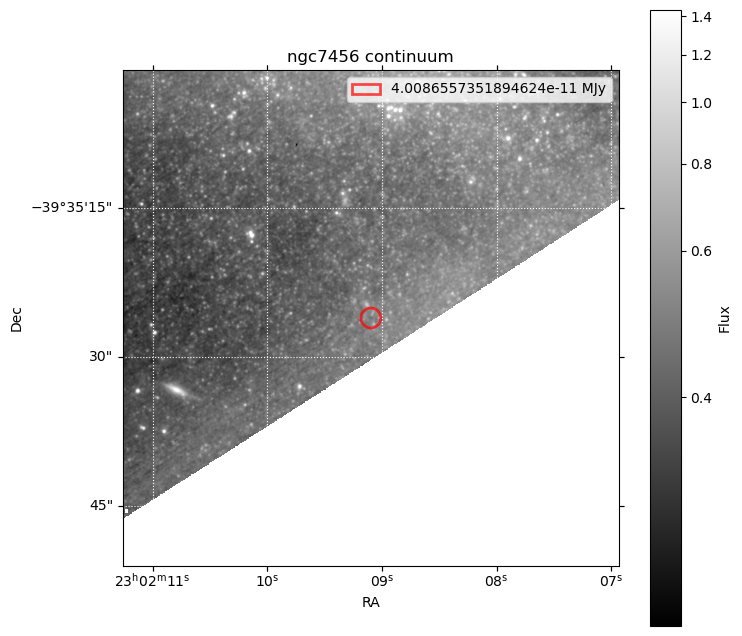

6761 regions found


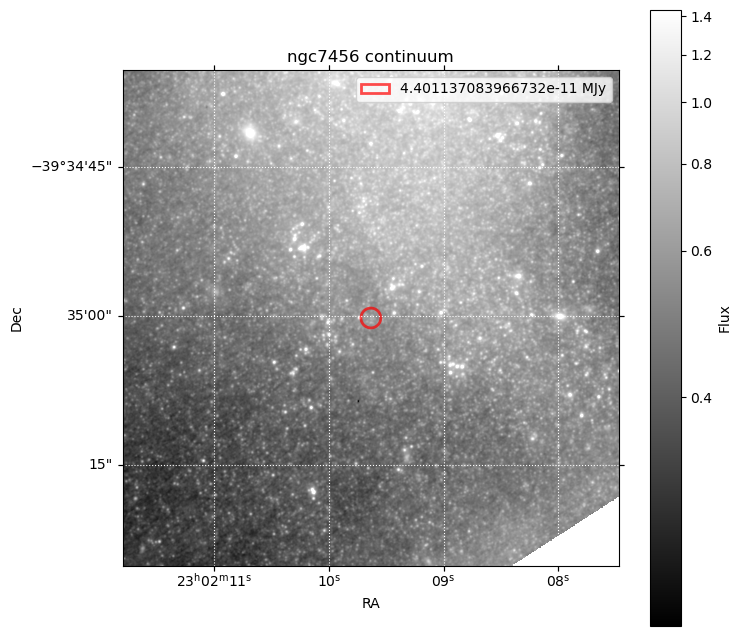

6761 regions found


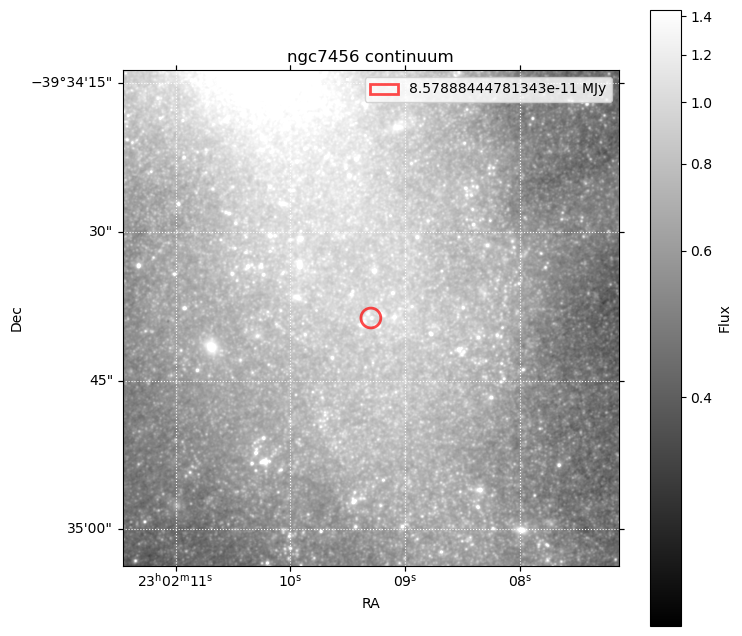

6761 regions found


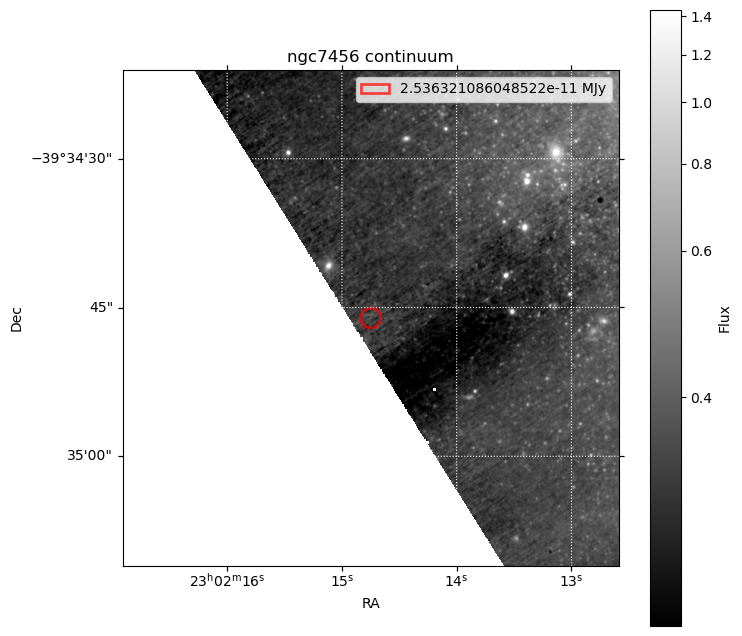

6761 regions found


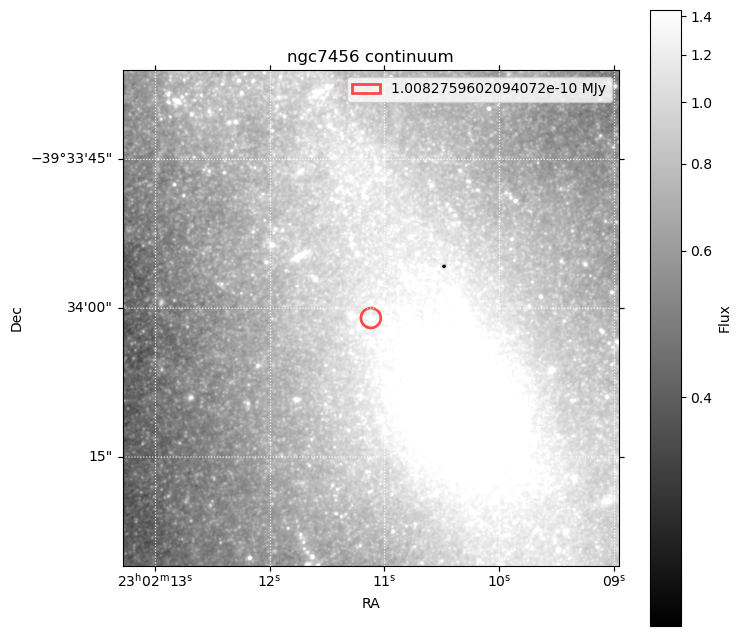

6761 regions found


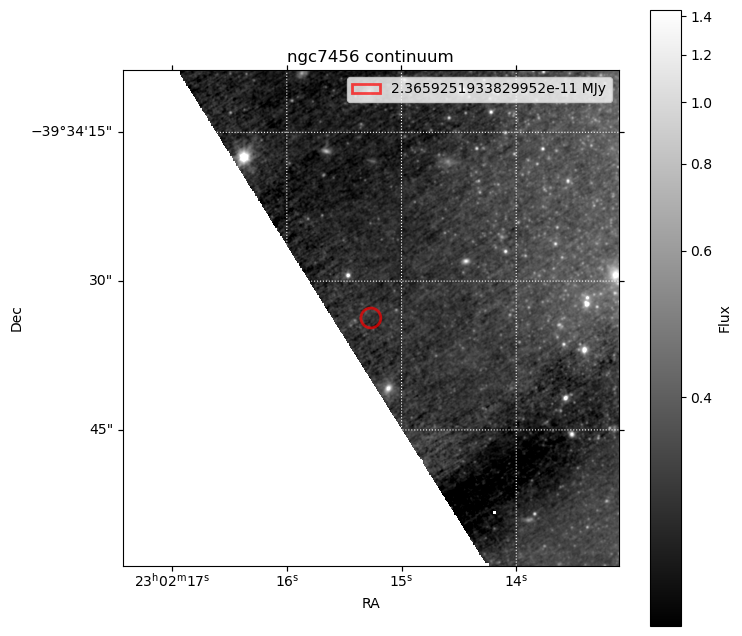

6761 regions found


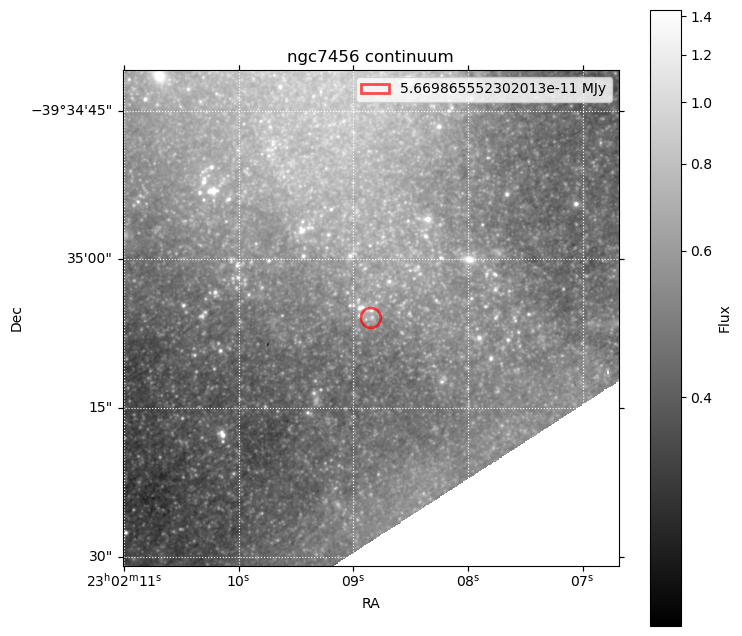

6761 regions found


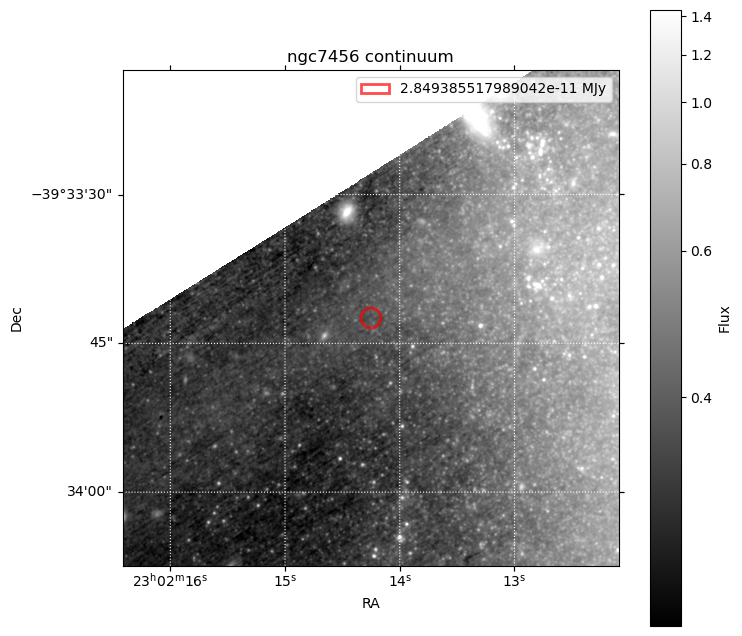

6761 regions found


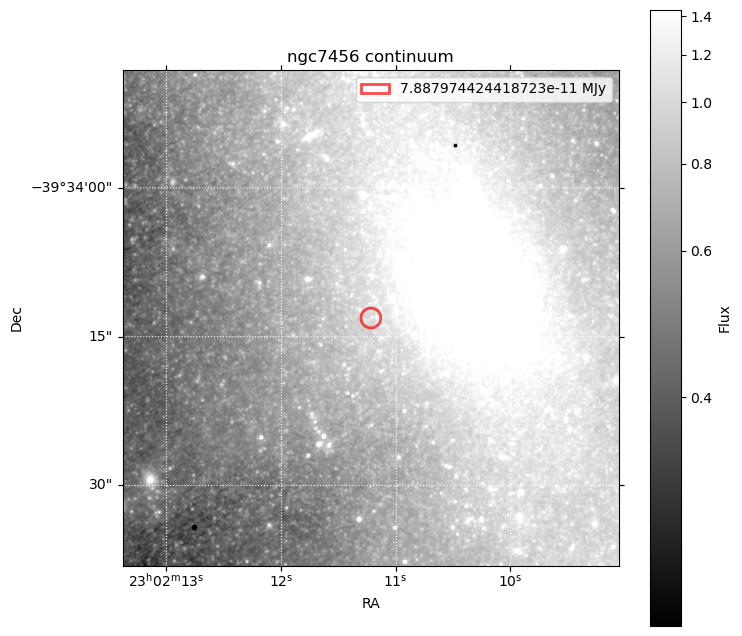

6761 regions found


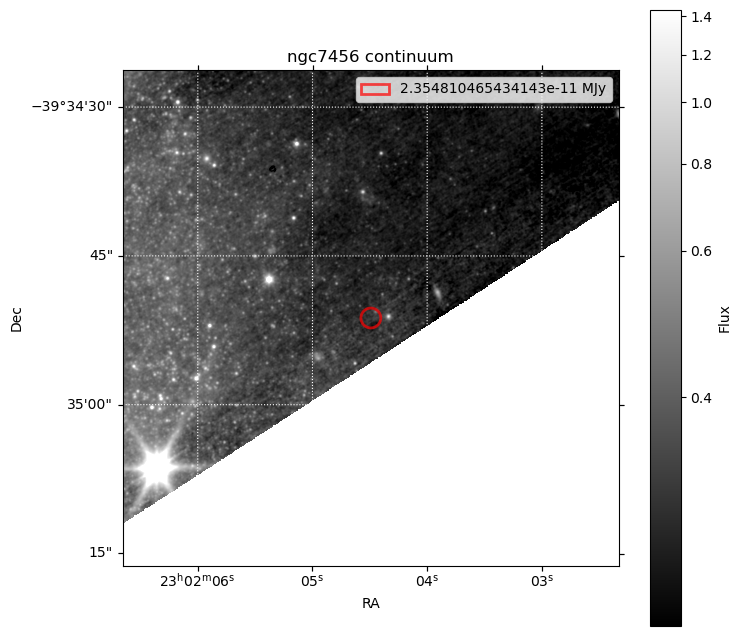

6761 regions found


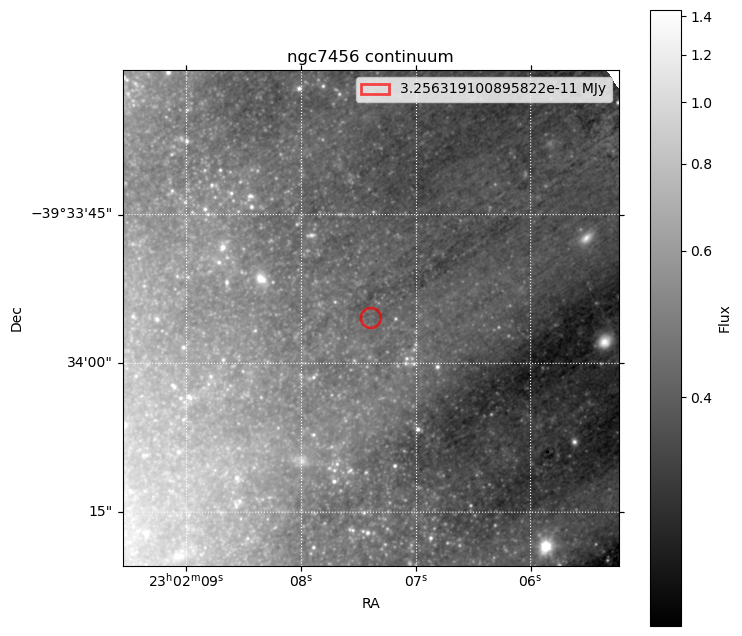

6761 regions found


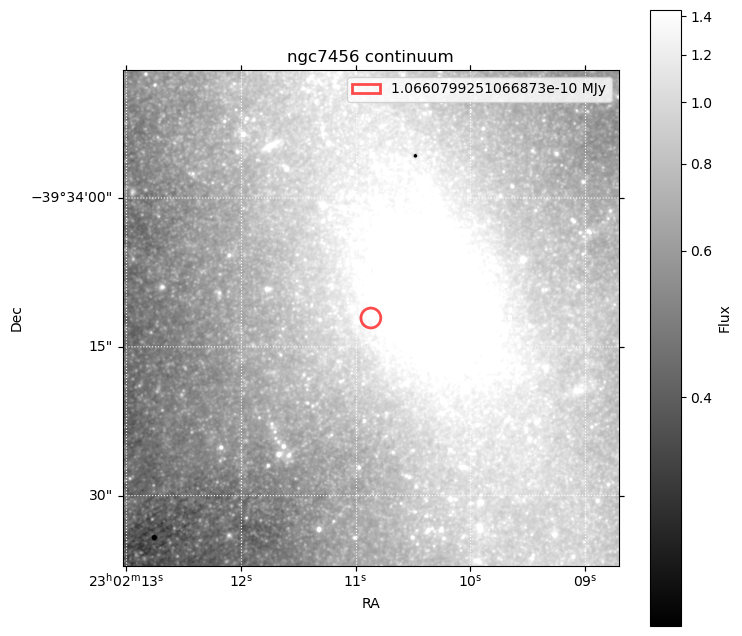

6761 regions found


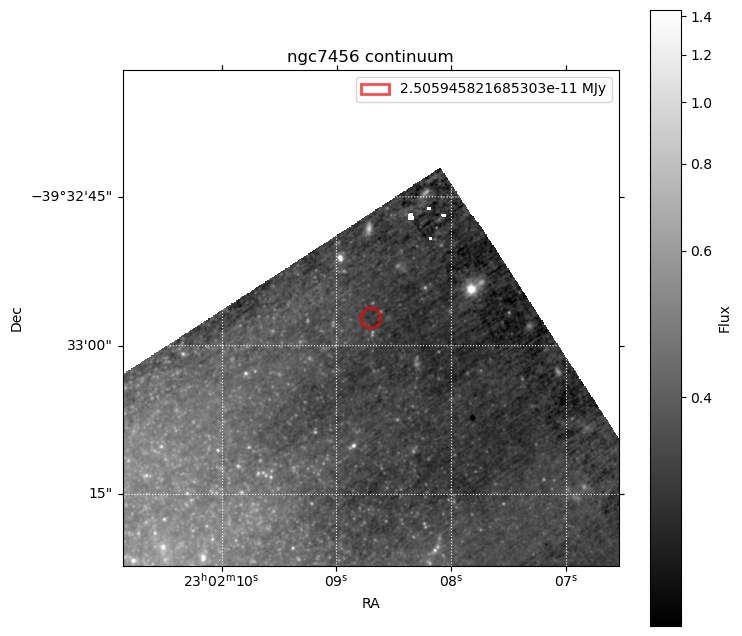

6761 regions found


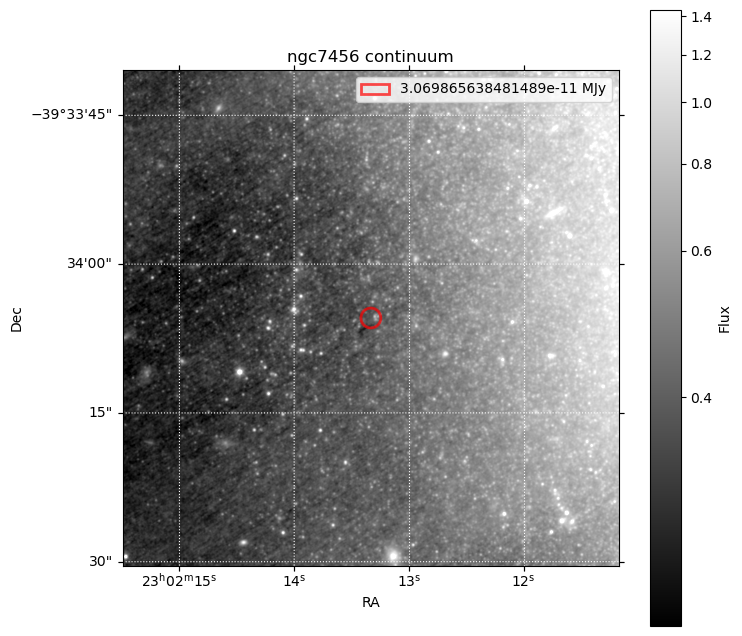

6761 regions found


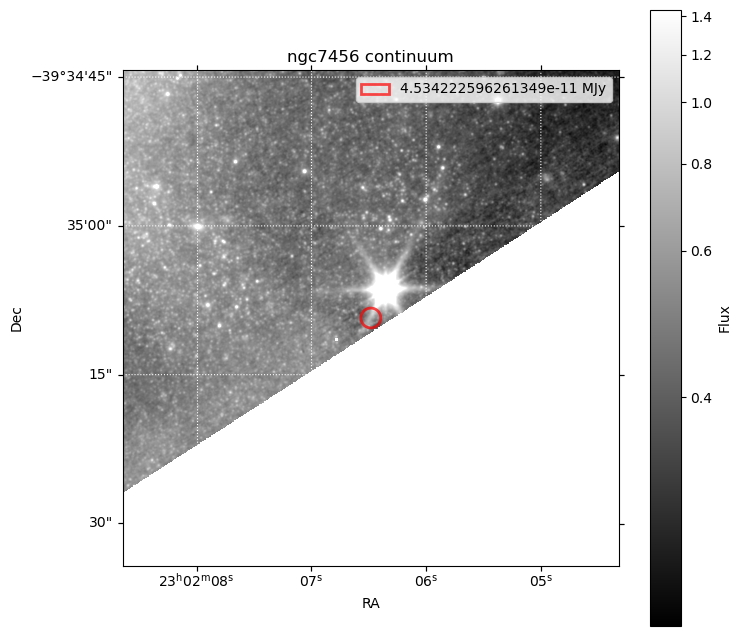

6761 regions found


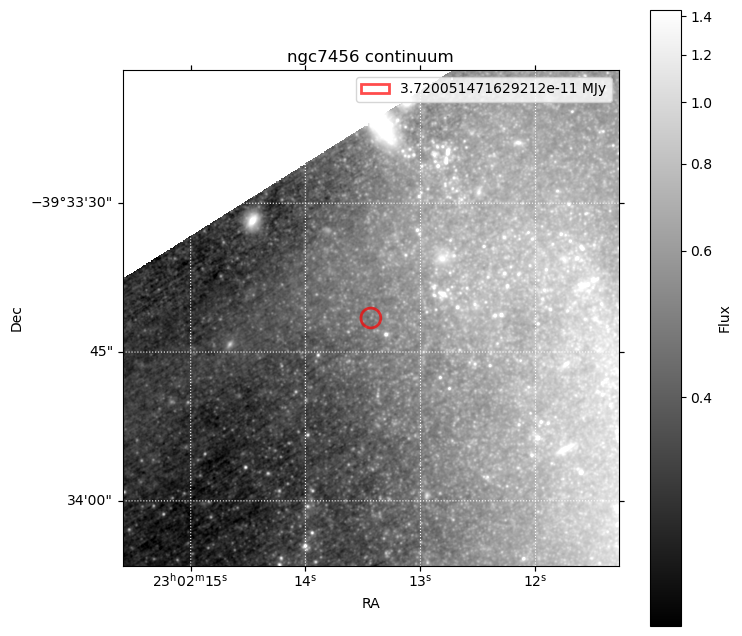

6761 regions found


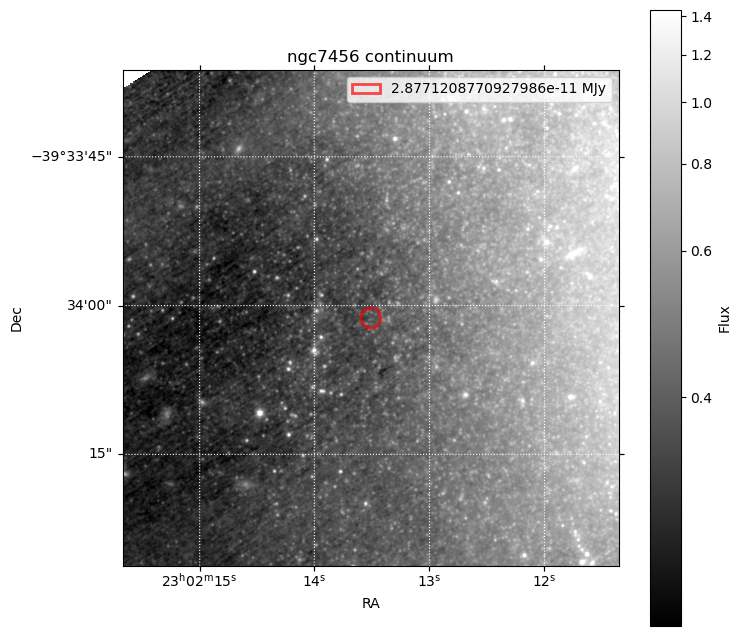

6761 regions found


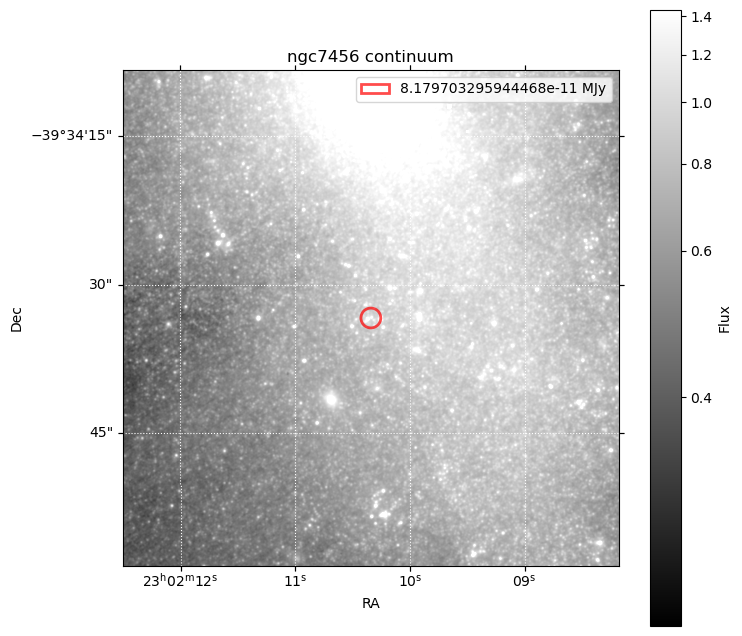

In [47]:
for file in raw_files:
    loc = pick_random_source_location(cont_subtracted_files[i], min_size = 15)
    raw = get_aperture_flux(raw_files[i], loc, radius, show_plot=True, zoom = zoom)


1408 regions found
3101.783044195887 614.6190442195216


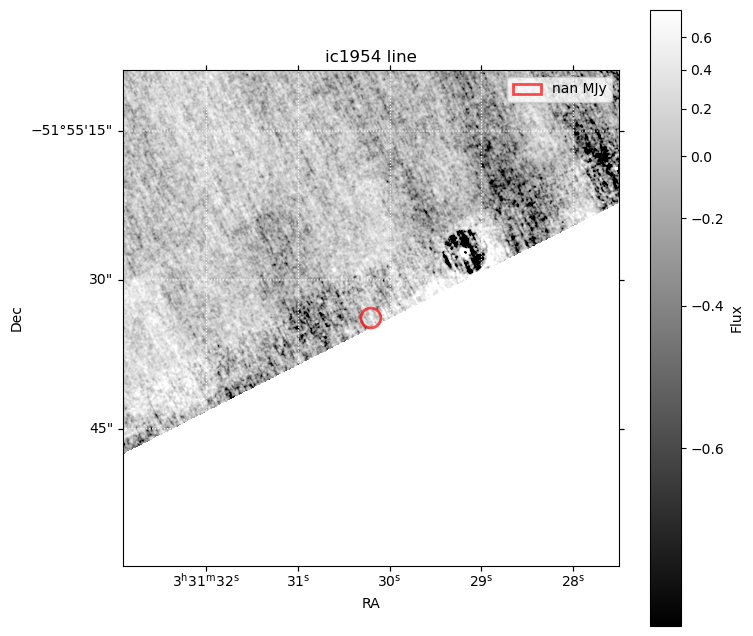

3101.783044195887 614.6190442195216


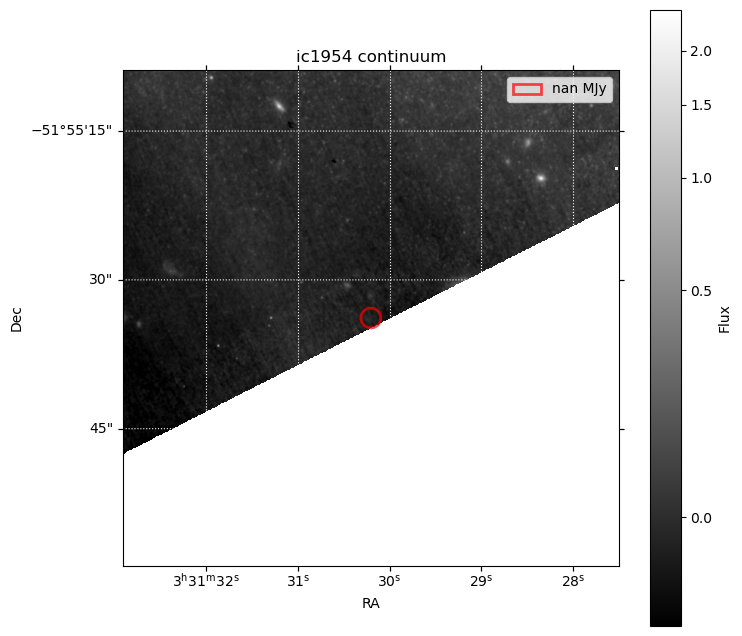

nan

In [34]:


# Example usage:
loc = pick_random_source_location('Data_files/Paschen_EW/ic1954_f187n_line.fits')
get_aperture_flux('Data_files/Paschen_EW/ic1954_f187n_line.fits', loc, radius, show_plot=True, zoom = zoom)
get_aperture_flux('Data_files/Paschen_EW/ic1954_f187n_continuum.fits', loc, radius, show_plot=True, zoom = zoom)


In [62]:
file

'Data_files/Paschen_EW/Pa_update_7-3-25/ic1954_nircam_lv3_f150w_conv.fits'

In [57]:
for file in cont_subtracted_files:
    print(file.split('/')[-1].split('_')[0])
    hdul = fits.open(file)
    header = hdul[0].header
    print(header['XPOSURE'])

ic1954
96.631
ic5273
96.631
ngc0685
96.631
ngc1511
96.631
ngc1546
96.631
ngc1559
96.631
ngc1809
96.631
ngc2090
96.631
ngc2283
96.631
ngc2775
96.631
ngc3059
96.631
ngc3137
96.631
ngc3239
96.631
ngc3344
96.631
ngc3368
96.631
ngc3507
96.631
ngc3511
96.631
ngc3521
96.631
ngc3596
96.631
ngc3621
96.631
ngc4424
96.631
ngc4457
96.631
ngc4540
96.631
ngc4569
96.631
ngc4571
96.631
ngc4654
96.631
ngc4694
96.631
ngc4781
96.631
ngc4941
96.631
ngc4951
96.631
ngc5042
96.631
ngc7456
96.631


SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 6190                                                  
NAXIS2  =                 6197                                                  
EXTNAME = 'SCI     '           / extension name                                 
MJD-BEG =    60221.71730947107 / [d] exposure start time in MJD                 
MJD-AVG =    60221.72109970081 / [d] exposure mid-point in MJD                  
MJD-END =    60221.72488993056 / [d] exposure end time in MJD                   
TDB-BEG =    60221.72186468065 / [d] TDB time of exposure start in MJD          
TDB-MID =    60221.72565469021 / [d] TDB time of exposure mid-point in MJD      
TDB-END =    60221.72944469977 / [d] TDB time of exposure end in MJD            
XPOSURE =               96.6